In [464]:
import netCDF4 as nc
import numpy as np
import matplotlib.pyplot as plt
from salishsea_tools import geo_tools, nc_tools, tidetools, viz_tools
import xarray as xr
from IPython.core.display import display, HTML
import scipy.signal as signal
import glob
import matplotlib.cm as cm
from matplotlib import animation, rc
import cmocean
import datetime
display(HTML("<style>.container { width:90% !important; }</style>"))

%matplotlib inline

In [207]:
rc('animation', html='html5')

In [152]:
nowcast = xr.open_dataset('https://salishsea.eos.ubc.ca/erddap/griddap/ubcSSg3DTracerFields1hV17-02')

In [423]:
bathy = nc.Dataset('/data/vdo/MEOPAR/NEMO-forcing/grid/bathymetry_201702.nc')

In [200]:
grid = xr.open_dataset('/data/vdo/MEOPAR/NEMO-forcing/grid/bathymetry_201702.nc')
mesh_mask = nc.Dataset('/data/vdo/MEOPAR/NEMO-forcing/grid/mesh_mask201702.nc')

In [605]:
winds_data = xr.open_dataset(
    'https://salishsea.eos.ubc.ca/erddap/griddap/ubcSSaSurfaceAtmosphereFieldsV1')

In [475]:
N = 1
Wn = 1/24
B, A = signal.butter(N,Wn)

In [332]:
import matplotlib.gridspec as gridspec

In [407]:
stations = np.array([(132, 597), (127, 603), (124, 610), (122, 620), (122, 629), #Baynes Sound
                    (140, 761), (157, 754), #Quadra
                     (195, 750), (212, 752), (210, 733) #Squirrel
                    ])

In [584]:
nemo_ji = np.array([[132, 597],
       [127, 603],
       [124, 610],
       [122, 620],
       [122, 629], [126,633], [126,642], [122,650]])

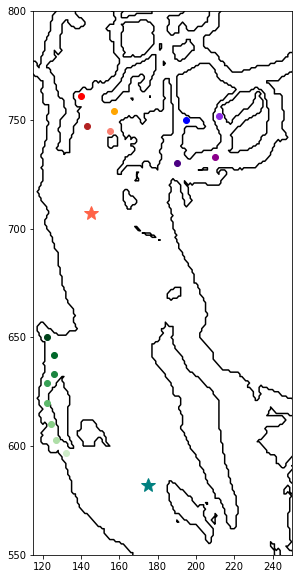

In [587]:
fig, ax = plt.subplots(figsize = (10,10))
colours = cm.Greens(np.linspace(0,1,10))
for pt, colour in zip(nemo_ji,colours[2:]):
    ax.plot(pt[0], pt[1], 'o', color=colour)
colours1 = cm.Oranges(np.linspace(0,1,6))
ax.set_xlim(115,250)
ax.set_ylim(550,800)
viz_tools.plot_coastline(ax, bathy)
viz_tools.set_aspect(ax)
ax.plot(140, 761, 'o', color = 'red')
ax.plot(157, 754, 'o', color = 'orange')
ax.plot(155, 745, 'o' , color = 'salmon')
ax.plot(143, 747, 'o', color = 'firebrick')
ax.plot(195, 750, 'bo')
ax.plot(212, 752, 'o', color = 'blueviolet')
ax.plot(210, 733, 'o', color = 'darkmagenta')
ax.plot(145, 707, '*', color = 'tomato', markersize=15)
ax.plot(175, 582, '*', color = 'teal', markersize = 15)
ax.plot(190, 730, 'o', color = 'indigo')
#fig.savefig('/home/vdo/Downloads/NewStation.png')

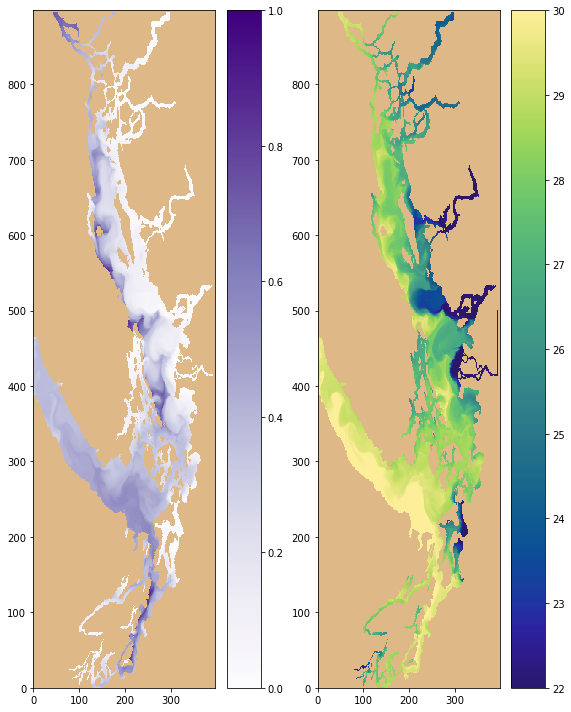

In [413]:
fig, ax = plt.subplots(1,2, figsize = (8,10))
trc = ax[0].pcolormesh(np.ma.masked_array(f.variables['mytracer'][-1,0,...],
                                          mask = 1 - mesh_mask.variables['tmask'][0,0,...]), 
                       vmin = 0, vmax = 1, cmap = 'Purples')
fig.colorbar(trc, ax = ax[0])
sal = ax[1].pcolormesh(np.ma.masked_array(g.variables['vosaline'][-1,0,...],
                                          mask = 1 - mesh_mask.variables['tmask'][0,0,...]),
                       vmin = 22, vmax = 30, cmap = cmocean.cm.haline)
fig.colorbar(sal, ax=ax[1])
fig.tight_layout()

In [616]:
def make_video(trc_full, sal_full, trc_lake, sal_lake):
    fig, ax = plt.subplots(figsize = (18,9))
    gs = gridspec.GridSpec(6, 16)
    ax1 = plt.subplot(gs[0, :])
    ax2 = plt.subplot(gs[1:4, 0:4])
    ax3 = plt.subplot(gs[1:4, 4:8])
    ax4 = plt.subplot(gs[1:4, 8:12])
    ax5 = plt.subplot(gs[1:4, 12:])
    ax6 = plt.subplot(gs[4:, 0])
    ax7 = plt.subplot(gs[4:, 1])
    ax8 = plt.subplot(gs[4:, 2])
    ax9 = plt.subplot(gs[4:, 3])
    ax10 = plt.subplot(gs[4:, 4])
    ax11 = plt.subplot(gs[4:, 5])
    ax12 = plt.subplot(gs[4:, 6])
    ax13 = plt.subplot(gs[4:, 7])
    ax14 = plt.subplot(gs[4:, 8])
    ax15 = plt.subplot(gs[4:, 9])
    ax16 = plt.subplot(gs[4:, 10])
    ax17 = plt.subplot(gs[4:, 11])
    ax18 = plt.subplot(gs[4:, 12])
    ax19 = plt.subplot(gs[4:, 13])
    ax20 = plt.subplot(gs[4:, 14])
    ax21 = plt.subplot(gs[4:, 15])
    for ax in [ax2, ax3, ax4, ax5, ax7, ax8, ax9, ax10, ax11, ax12, ax13, ax14, ax15, ax16, ax17, ax18, ax19, ax20, ax21]:
        ax.tick_params(labelleft = False, left = False, bottom = False, labelbottom = False)
    plt.tight_layout()
    viz_tools.set_aspect(ax2)
    viz_tools.set_aspect(ax3)
    viz_tools.set_aspect(ax4)
    viz_tools.set_aspect(ax5)
    first = nc.num2date(sal_full.variables['time_counter'][0], 
                        sal_full.variables['time_counter'].units)
    end_index = sal_full.variables['time_counter'][:].shape[0]
    times = np.array([first + datetime.timedelta(hours = i) for i in range(end_index)])
    averaged_SI_u_winds = np.array([])
    averaged_SI_v_winds = np.array([])
    averaged_SS_u_winds = np.array([])
    averaged_SS_v_winds = np.array([])
    for n in range(end_index):
        SI_u_winds = winds_data.u_wind.isel(gridY=slice(159,162), 
                                            gridX=slice(119,122)).sel(time=times[n], 
                                                                      method = 'nearest').values
        averaged_SI_u_winds = np.append(averaged_SI_u_winds, np.mean(SI_u_winds))
        SI_v_winds = winds_data.v_wind.isel(gridY=slice(159,162), 
                                            gridX=slice(119,122)).sel(time=times[n], 
                                                                      method = 'nearest').values
        averaged_SI_v_winds = np.append(averaged_SI_v_winds, np.mean(SI_v_winds))
        SS_u_winds = winds_data.u_wind.isel(gridY=slice(182,185), 
                                            gridX=slice(106,109)).sel(time=times[n], 
                                                                      method = 'nearest').values
        averaged_SS_u_winds = np.append(averaged_SS_u_winds, np.mean(SS_u_winds))
        SS_v_winds = winds_data.v_wind.isel(gridY=slice(182,185), 
                                            gridX=slice(106,109)).sel(time=times[n], 
                                                                      method = 'nearest').values
        averaged_SS_v_winds = np.append(averaged_SS_v_winds, np.mean(SS_v_winds))
    rotated_SI_u_winds, rotated_SI_v_winds = viz_tools.rotate_vel(averaged_SI_u_winds, 
                                                                  averaged_SI_v_winds, 
                                                                  origin = 'map' )
    rotated_SS_u_winds, rotated_SS_v_winds = viz_tools.rotate_vel(averaged_SS_u_winds, 
                                                                  averaged_SS_v_winds, 
                                                                  origin = 'map' )
    SIwindfu = signal.filtfilt(B,A, rotated_SI_u_winds)
    SIwindfv = signal.filtfilt(B,A, rotated_SI_v_winds)
    SSwindfu = signal.filtfilt(B,A, rotated_SS_u_winds)
    SSwindfv = signal.filtfilt(B,A, rotated_SS_v_winds)
    ax1.set_title('Averaged and Filtered Winds')
    depths = sal_full.variables['deptht'][:]
    greens = cm.Greens(np.linspace(0,1,10))
    def animate30(i):
        date = times[i]
        for ax in [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12, ax13, ax14, ax15, ax16, ax17, ax18, ax19, ax20, ax21]:
            ax.clear()
        cmap = plt.get_cmap('Purples')
        cmap.set_bad('burlywood')
        ax1.plot(times, SIwindfu, '--', color = 'teal')
        ax1.plot(times, SIwindfv, '-', color = 'teal')
        ax1.plot(times, SSwindfu, '--', color = 'tomato')
        ax1.plot(times, SSwindfv, '-', color = 'tomato')
        ax1.grid('on')
        ax1.set_ylim(-10,15)
        ax1.plot((date, date), (-10,15), 'b--', color = 'black')
        ax2.pcolormesh(np.ma.masked_array(sal_full.variables['vosaline'][i,0,550:800, 115:250], 
                                          mask = 1 - mesh_mask.variables['tmask'][0, 0, 550:800, 115:250]),
                       cmap = cmocean.cm.haline, vmin = 22, vmax = 30)
        ax3.pcolormesh(np.ma.masked_array(sal_lake.variables['vosaline'][i,0,550:800, 115:250],
                                          mask = 1 - mesh_mask.variables['tmask'][0, 0, 550:800, 115:250]),
                       cmap = cmocean.cm.haline, vmin = 22, vmax = 30)
        ax4.pcolormesh(np.ma.masked_array(trc_full.variables['mytracer'][i,0,550:800, 115:250], 
                                          mask = 1 - mesh_mask.variables['tmask'][0, 0, 550:800, 115:250]),
                       cmap = cmap, vmin = 0, vmax = 1)
        ax5.pcolormesh(np.ma.masked_array(trc_lake.variables['mytracer'][i,0,550:800, 115:250],
                                          mask = 1 - mesh_mask.variables['tmask'][0, 0, 550:800, 115:250]),
                       cmap = cmap, vmin = 0, vmax = 1)
        ax6.plot(np.ma.masked_array(trc_full.variables['mytracer'][i,:,597, 132],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,597, 132]),
                 depths, '--', color = greens[2])
        ax6.plot(np.ma.masked_array(trc_lake.variables['mytracer'][i,:,597, 132],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,597, 132]),
                 depths, color = greens[2])
        ax6.set_ylim(60, 0)
        ax6.set_xlim(0, 1)
        ax7.plot(np.ma.masked_array(trc_full.variables['mytracer'][i,:,603, 127],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,603, 127]),
                 depths, '--', color = greens[3])
        ax7.plot(np.ma.masked_array(trc_lake.variables['mytracer'][i,:,603, 127],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,603, 127]),
                 depths, color = greens[3])
        ax7.set_ylim(60, 0)
        ax7.set_xlim(0, 1)
        ax8.plot(np.ma.masked_array(trc_full.variables['mytracer'][i,:,610, 124],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,610, 124]),
                 depths, '--', color = greens[4])
        ax8.plot(np.ma.masked_array(trc_lake.variables['mytracer'][i,:,610, 124],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,610, 124]),
                 depths, color = greens[4])
        ax8.set_ylim(60, 0)
        ax8.set_xlim(0, 1)
        ax9.plot(np.ma.masked_array(trc_full.variables['mytracer'][i,:,620, 122],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,620, 122]),
                 depths, '--', color = greens[5])
        ax9.plot(np.ma.masked_array(trc_lake.variables['mytracer'][i,:,620, 122],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,620, 122]),
                 depths, color = greens[5])
        ax9.set_ylim(60, 0)
        ax9.set_xlim(0, 1)
        ax10.plot(np.ma.masked_array(trc_full.variables['mytracer'][i,:,629, 122],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,629, 122]),
                 depths, '--', color = greens[6])
        ax10.plot(np.ma.masked_array(trc_lake.variables['mytracer'][i,:,629, 122],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,629, 122]),
                 depths, color = greens[6])
        ax10.set_ylim(60, 0)
        ax10.set_xlim(0, 1)
        ax11.plot(np.ma.masked_array(trc_full.variables['mytracer'][i,:,633, 126],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,633, 126]),
                 depths, '--', color = greens[7])
        ax11.plot(np.ma.masked_array(trc_lake.variables['mytracer'][i,:,633, 126],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,633, 126]),
                 depths, color = greens[7])
        ax11.set_ylim(60, 0)
        ax11.set_xlim(0, 1)
        ax12.plot(np.ma.masked_array(trc_full.variables['mytracer'][i,:,642, 126],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,642, 126]),
                 depths, '--', color = greens[8])
        ax12.plot(np.ma.masked_array(trc_lake.variables['mytracer'][i,:,642, 126],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,642, 126]),
                 depths, color = greens[8])
        ax12.set_ylim(60, 0)
        ax12.set_xlim(0, 1)
        ax13.plot(np.ma.masked_array(trc_full.variables['mytracer'][i,:,650, 122],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,650, 122]),
                 depths, '--', color = greens[9])
        ax13.plot(np.ma.masked_array(trc_lake.variables['mytracer'][i,:,650, 122],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,650, 122]),
                 depths, color = greens[9])
        ax13.set_ylim(60, 0)
        ax13.set_xlim(0, 1)
        ax14.plot(np.ma.masked_array(trc_full.variables['mytracer'][i,:,761, 140],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,761, 140]),
                 depths, '--', color = 'red')
        ax14.plot(np.ma.masked_array(trc_lake.variables['mytracer'][i,:,761, 140],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,761, 140]),
                 depths, color = 'red')
        ax14.set_ylim(60, 0)
        ax14.set_xlim(0, 1)
        ax15.plot(np.ma.masked_array(trc_full.variables['mytracer'][i,:,754, 157],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,754, 157]),
                 depths, '--', color = 'orange')
        ax15.plot(np.ma.masked_array(trc_lake.variables['mytracer'][i,:,754, 132],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,754, 157]),
                 depths, color = 'orange')
        ax15.set_ylim(60, 0)
        ax15.set_xlim(0, 1)
        ax16.plot(np.ma.masked_array(trc_full.variables['mytracer'][i,:,745, 155],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,745, 155]),
                 depths, '--', color = 'salmon')
        ax16.plot(np.ma.masked_array(trc_lake.variables['mytracer'][i,:,745, 155],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,745, 155]),
                 depths, color = 'salmon')
        ax16.set_ylim(60, 0)
        ax16.set_xlim(0, 1)
        ax17.plot(np.ma.masked_array(trc_full.variables['mytracer'][i,:,747, 143],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,747, 143]),
                 depths, '--', color = 'firebrick')
        ax17.plot(np.ma.masked_array(trc_lake.variables['mytracer'][i,:,747, 143],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,747, 143]),
                 depths, color = 'firebrick')
        ax17.set_ylim(60, 0)
        ax17.set_xlim(0, 1)
        ax18.plot(np.ma.masked_array(trc_full.variables['mytracer'][i,:,750, 195],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,750, 195]),
                 depths, '--', color = 'blue')
        ax18.plot(np.ma.masked_array(trc_lake.variables['mytracer'][i,:,750, 195],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,750, 195]),
                 depths, color = 'blue')
        ax18.set_ylim(60, 0)
        ax18.set_xlim(0, 1)
        ax19.plot(np.ma.masked_array(trc_full.variables['mytracer'][i,:,752, 212],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,752, 212]),
                 depths, '--', color = 'blueviolet')
        ax19.plot(np.ma.masked_array(trc_lake.variables['mytracer'][i,:,752, 212],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,752, 212]),
                 depths, color = 'blueviolet')
        ax19.set_ylim(60, 0)
        ax19.set_xlim(0, 1)
        ax20.plot(np.ma.masked_array(trc_full.variables['mytracer'][i,:,733, 210],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,733, 210]),
                 depths, '--', color = 'darkmagenta')
        ax20.plot(np.ma.masked_array(trc_lake.variables['mytracer'][i,:,733, 210],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,733, 210]),
                 depths, color = 'darkmagenta')
        ax20.set_ylim(60, 0)
        ax20.set_xlim(0, 1)
        ax21.plot(np.ma.masked_array(trc_full.variables['mytracer'][i,:,730, 190],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,730, 190]),
                 depths, '--', color='indigo')
        ax21.plot(np.ma.masked_array(trc_lake.variables['mytracer'][i,:,730, 190],
                                    mask = 1 - mesh_mask.variables['tmask'][0,:,730, 190]),
                 depths, color = 'indigo')
        ax21.set_ylim(60, 0)
        ax21.set_xlim(0, 1)
        ax2.set_title('Salinity - Full')
        ax3.set_title('Salinity - Lake')
        ax4.set_title('Tracer - Full')
        ax5.set_title('Tracer - Lake')
        
        return ax
    
    ani40 = animation.FuncAnimation(fig,animate30,frames=end_index,interval=interval*1e+3, repeat=False)
    return ani40

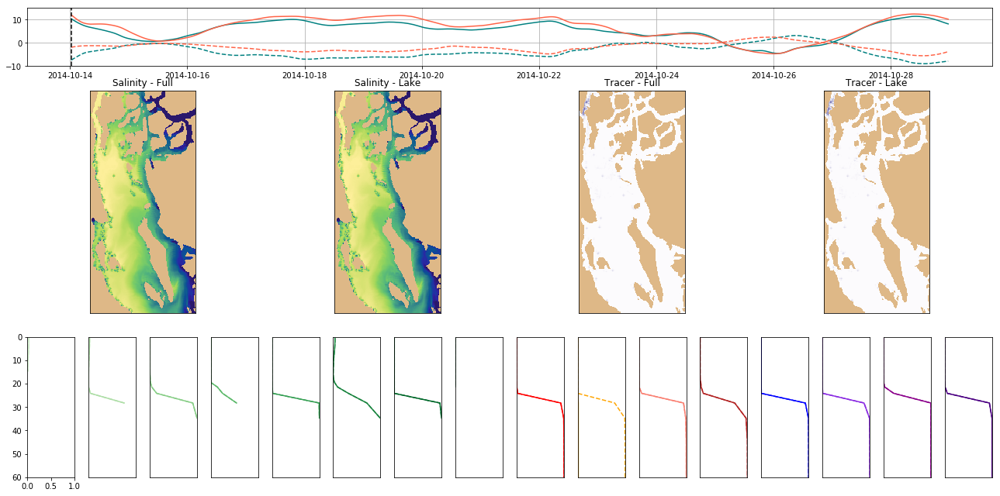

In [617]:
make_video(nc.Dataset(
'/ocean/vdo/MEOPAR/completed-runs/SalishSea_TRC/14oct14/SalishSea_1h_20141014_20141028_ptrc_T.nc'),
          nc.Dataset('/ocean/vdo/MEOPAR/completed-runs/SalishSea_TRC/14oct14/SalishSea_1h_20141014_20141028_grid_T.nc'),
          nc.Dataset('/ocean/vdo/MEOPAR/completed-runs/salinityanomilies/14oct14/SalishSea_1h_20141014_20141028_ptrc_T.nc'),
          nc.Dataset('/ocean/vdo/MEOPAR/completed-runs/salinityanomilies/14oct14/SalishSea_1h_20141014_20141028_grid_T.nc'))

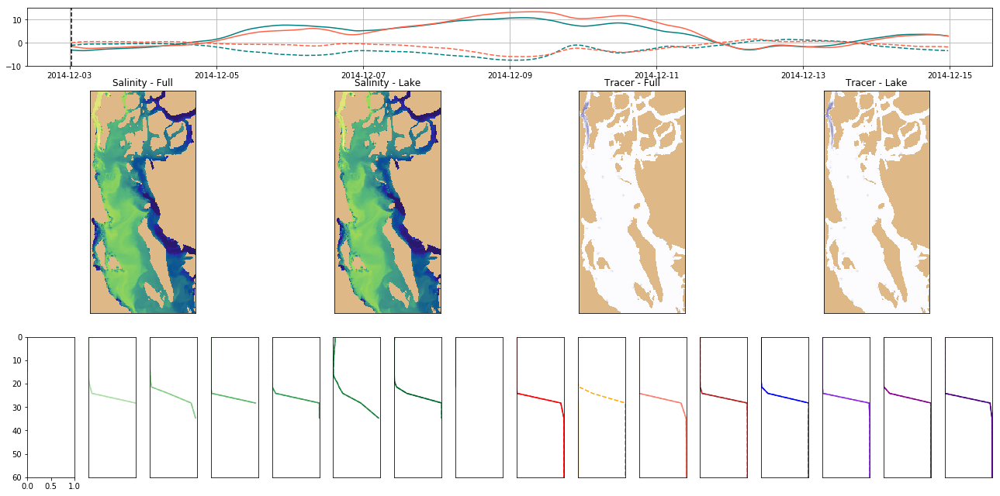

In [618]:
make_video(nc.Dataset(
'/ocean/vdo/MEOPAR/completed-runs/SalishSea_TRC/03dec14/SalishSea_1h_20141203_20141214_ptrc_T.nc'),
          nc.Dataset(
    '/ocean/vdo/MEOPAR/completed-runs/SalishSea_TRC/03dec14/SalishSea_1h_20141203_20141214_grid_T.nc'),
          nc.Dataset(
'/ocean/vdo/MEOPAR/completed-runs/salinityanomilies/dec14/SalishSea_1h_20141203_20141214_ptrc_T.nc'),
          nc.Dataset(
'/ocean/vdo/MEOPAR/completed-runs/salinityanomilies/dec14/SalishSea_1h_20141203_20141214_grid_T.nc'))

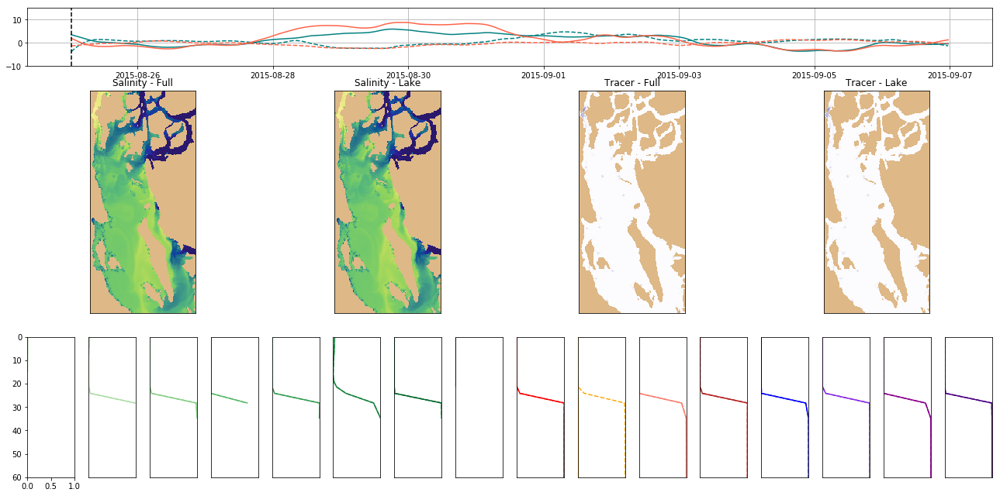

In [619]:
make_video(nc.Dataset(
'/ocean/vdo/MEOPAR/completed-runs/SalishSea_TRC/25aug15/SalishSea_1h_20150825_20150906_ptrc_T.nc'),
          nc.Dataset(
    '/ocean/vdo/MEOPAR/completed-runs/SalishSea_TRC/25aug15/SalishSea_1h_20150825_20150906_grid_T.nc'),
          nc.Dataset(
'/ocean/vdo/MEOPAR/completed-runs/salinityanomilies/25aug15/SalishSea_1h_20150825_20150906_ptrc_T.nc'),
          nc.Dataset(
'/ocean/vdo/MEOPAR/completed-runs/salinityanomilies/25aug15/SalishSea_1h_20150825_20150906_grid_T.nc'))